# <center><font color='blue'>Deep Learning : <i>Object Detection Using Adaptive Mask RCNN in Optical Remote Sensing Images</i></font></center>
<center>Méthodologie : CRISP-DM</center>


<font color='green' size="+1"><b>[<font color='Black'>Lien du Présentation</font>](https://www.canva.com/design/DAFupDHeySI/bAdR_zQTRmZXZqv-4vpPfw/edit?utm_content=DAFupDHeySI&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton)</b></font>


><font color='#007ACC' size="+1"><b>Phase 3 : Data Preparation</b></font>


In [1]:
import matplotlib.pyplot as plt
import os
import pandas as pd
from skimage import transform
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tensorflow as tf

In [2]:
def load_dataset(base_path):
    images = []
    annotations = []
    image_sizes = []

    # Update paths according to your directory structure
    image_path = os.path.join(base_path, 'images')
    annotation_path = os.path.join(base_path, 'ground truth')

    # List all files in the image directory
    for file in os.listdir(image_path):
        img_path = os.path.join(image_path, file)
        annot_path = os.path.join(annotation_path, file.replace('.jpg', '.txt'))

        # Load image
        image = cv2.imread(img_path)
        if image is None:
            continue  # Skip if the image cannot be loaded
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize image to 1024x1024
        resized_image = cv2.resize(image, (1024, 1024))
        images.append(resized_image)

        # Get image size and dimensions
        height, width, channels = image.shape
        image_sizes.append((height, width, channels))

        # Load annotations
        annots = []
        if os.path.exists(annot_path):
            with open(annot_path, 'r') as f:
                for line in f:
                    # Clean up and split the line
                    parts = line.replace('(', '').replace(')', '').replace(' ', '').strip().split(',')
                    if len(parts) < 5:
                        continue  # Skip lines that do not have enough information
                    try:
                        x1, y1, x2, y2, class_id = map(int, parts)
                        # Resize annotations to match resized image
                        x1_new = int(round(x1 * (1024/width)))
                        y1_new = int(round(y1 * (1024/height)))
                        x2_new = int(round(x2 * (1024/width)))
                        y2_new = int(round(y2 * (1024/height)))
                        annots.append((x1_new, y1_new, x2_new, y2_new, class_id))
                    except ValueError:
                        continue  # Skip lines that cannot be converted to integers
        annotations.append(annots)

    # Create a DataFrame for image sizes
    image_df = pd.DataFrame(image_sizes, columns=['Height', 'Width', 'Channels'])

    return images, annotations, image_df

In [3]:
# ! pip install opencv-python --upgrade

In [4]:
import cv2

In [5]:
positive_image_set_path = "C:\\Users\\Yasmine\\OneDrive - ESPRIT\\Bureau\\pdl\\NWPU VHR-10 dataset"
images, annotations, image_df = load_dataset(positive_image_set_path)

# Display the first 10 rows of the image_df DataFrame
print(image_df.head(10))

   Height  Width  Channels
0     808    958         3
1     806    950         3
2     803    889         3
3     732    946         3
4     753    966         3
5     784    982         3
6     769    985         3
7     765    980         3
8     767    980         3
9     752    979         3


In [6]:
print(image_df.shape)

(650, 3)


In [7]:
print(annotations[1])

[(620, 145, 684, 206, 1), (78, 387, 143, 469, 1), (226, 403, 294, 488, 1), (330, 475, 371, 534, 1), (482, 675, 577, 803, 1), (589, 769, 674, 898, 1), (681, 864, 776, 1004, 1)]


In [8]:
def resize_image(image, target_size):
    # Resize the image to the target size
    resized_image = cv2.resize(image, target_size)
    return resized_image


In [10]:
target_size = (1024, 1024)
resized_images = [resize_image(image, target_size) for image in images]
resized_image_sizes = [(image.shape[0], image.shape[1], image.shape[2]) for image in resized_images]
resized_image_df = pd.DataFrame(resized_image_sizes, columns=['Resized_Height', 'Resized_Width', 'Channels'])
print(resized_image_df.head(10))

   Resized_Height  Resized_Width  Channels
0            1024           1024         3
1            1024           1024         3
2            1024           1024         3
3            1024           1024         3
4            1024           1024         3
5            1024           1024         3
6            1024           1024         3
7            1024           1024         3
8            1024           1024         3
9            1024           1024         3


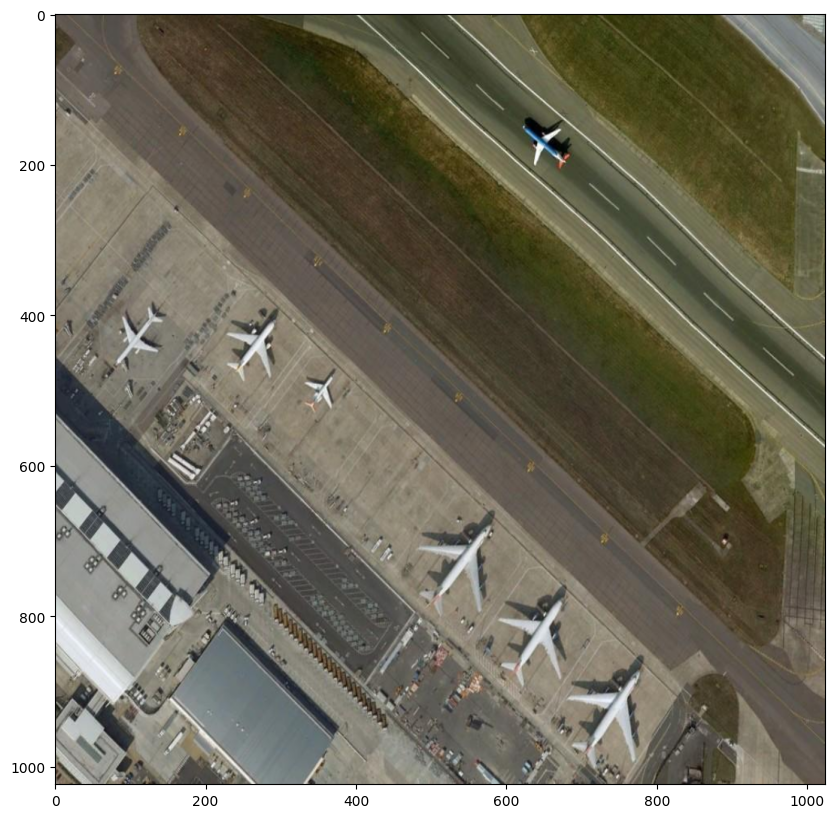

In [11]:
# Create subplots and get the axis object
fig, ax = plt.subplots(1, figsize=(10, 10))

# Assuming resized_images is a list of images
ax.imshow(resized_images[1])  # Show the second image from the list

plt.show()


In [12]:
class_names = {
    1: "Airplane", 2: "Ship", 3: "Storage Tank", 4: "Baseball Diamond",
    5: "Tennis Court", 6: "Basketball Court", 7: "Ground Track Field",
    8: "Harbor", 9: "Bridge", 10: "Vehicle"
}

def show_image_with_boxes(image, boxes, figsize=(10, 10)):
    """ Show image with bounding boxes. """
    fig, ax = plt.subplots(1, figsize=figsize)
    ax.imshow(image)

    # Add a rectangle and label for each box
    for x1, y1, x2, y2, class_id in boxes:
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        label = class_names[class_id]
        ax.text(x1, y1, label, color='white', backgroundcolor='red', fontsize=8)

    plt.show()

[559, 611]


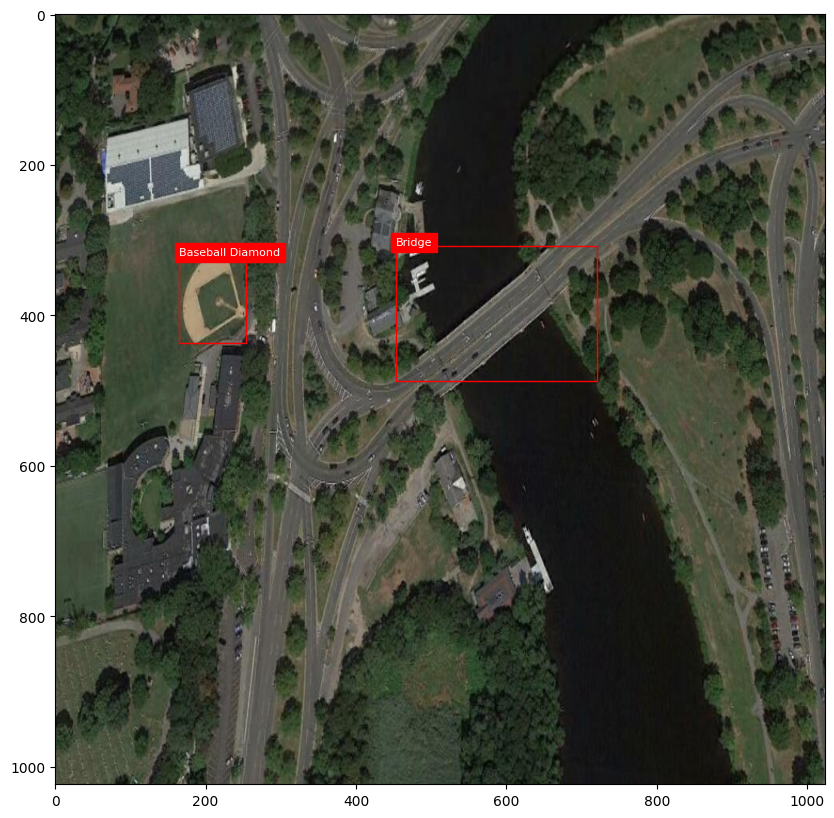

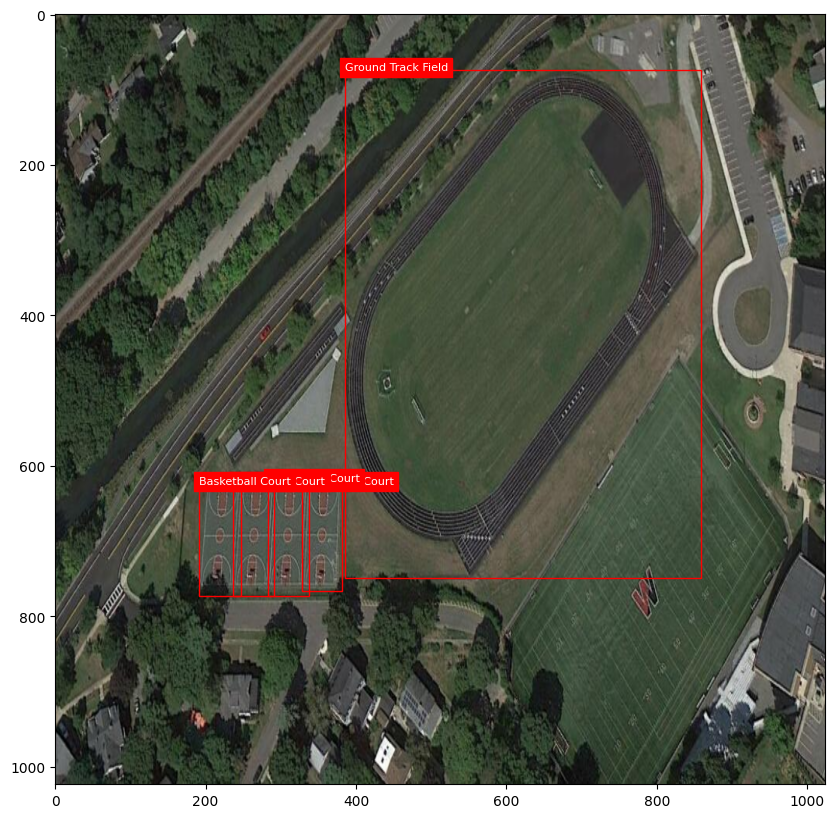

In [13]:
# Select random images to display
num_samples_to_show = 2
selected_indices = random.sample(range(len(resized_images)), num_samples_to_show)
print(selected_indices)
for index in selected_indices:
    show_image_with_boxes(resized_images[index], annotations[index])

In [14]:
resized_images[:2]

[array([[[ 78,  89,  49],
         [ 78,  89,  49],
         [ 79,  90,  50],
         ...,
         [ 96, 108,  79],
         [ 94, 107,  79],
         [ 93, 106,  78]],
 
        [[ 77,  88,  48],
         [ 77,  88,  48],
         [ 79,  90,  50],
         ...,
         [ 96, 109,  79],
         [ 94, 108,  79],
         [ 94, 107,  79]],
 
        [[ 76,  86,  48],
         [ 76,  87,  48],
         [ 78,  89,  50],
         ...,
         [ 96, 110,  80],
         [ 94, 107,  79],
         [ 93, 105,  77]],
 
        ...,
 
        [[113, 126, 119],
         [113, 126, 117],
         [114, 127, 118],
         ...,
         [ 86,  91,  59],
         [ 85,  90,  58],
         [ 84,  89,  57]],
 
        [[112, 126, 119],
         [113, 126, 117],
         [114, 126, 118],
         ...,
         [ 86,  91,  59],
         [ 85,  90,  58],
         [ 84,  89,  57]],
 
        [[112, 125, 118],
         [113, 126, 117],
         [113, 126, 117],
         ...,
         [ 87,  92,  60],
  

In [15]:
annotations[:2]

[[(602, 606, 673, 726, 1)],
 [(620, 145, 684, 206, 1),
  (78, 387, 143, 469, 1),
  (226, 403, 294, 488, 1),
  (330, 475, 371, 534, 1),
  (482, 675, 577, 803, 1),
  (589, 769, 674, 898, 1),
  (681, 864, 776, 1004, 1)]]

In [ ]:
# from collections import Counter

# from collections import Counter
# labels_counter = Counter()

# for idx in range(len(images)):
#     _, label = images[idx]
#     labels_counter[label.item()] += 1

# labels_counter


In [ ]:
# ! pip install scikit-learn
#! pip install albumentations

In [16]:
from sklearn.model_selection import train_test_split
import numpy as np
# Split the dataset into training and testing sets (70% training, 30% testing)
train_images, test_images, train_annotations, test_annotations = train_test_split(
    resized_images, annotations, test_size=0.30, random_state=42)

# Now 'train_images' and 'train_annotations' are used for training,
# 'test_images' and 'test_annotations' are used for testing.

print("Training images count:", len(train_images))
print("Testing images count:", len(test_images))
print("Training annotations count:", len(train_annotations))
print("Testing annotations count:", len(test_annotations))

Training images count: 455
Testing images count: 195
Training annotations count: 455
Testing annotations count: 195


In [17]:
from albumentations import Compose, HorizontalFlip, VerticalFlip, Rotate, BboxParams

# Définir le pipeline d'augmentation avec le support des boîtes englobantes et des étiquettes de classe
augmentation_pipeline = Compose([
    HorizontalFlip(p=0.5),
    VerticalFlip(p=0.5),
    Rotate(limit=90, p=0.5)
], bbox_params=BboxParams(format='pascal_voc', label_fields=['class_labels']))


In [18]:
def apply_augmentations(images, bboxes):
    augmented_images = images.copy()  # Commencer avec la liste des images originales
    augmented_bboxes = bboxes.copy()  # Commencer avec la liste des boîtes originales

    for img, bbox in zip(images, bboxes):
        transformed_bboxes = [(x_min, y_min, x_max, y_max) for (x_min, y_min, x_max, y_max, class_id) in bbox]
        class_labels = [class_id for (_, _, _, _, class_id) in bbox]
        
        # Appliquer l'augmentation
        augmented = augmentation_pipeline(image=img, bboxes=transformed_bboxes, class_labels=class_labels)
        
        # Ajouter l'image augmentée à la liste des images
        augmented_images.append(augmented['image'])
        
        # Ajouter les boîtes augmentées à la liste des boîtes, en conservant les class IDs
        new_bboxes = [(b[0], b[1], b[2], b[3], class_label) for b, class_label in zip(augmented['bboxes'], augmented['class_labels'])]
        augmented_bboxes.append(new_bboxes)

    return augmented_images, augmented_bboxes


In [19]:
# Appliquer les augmentations et obtenir les ensembles enrichis
train_images_augmented, train_annotations_augmented = apply_augmentations(train_images, train_annotations)

# Afficher la taille des ensembles pour vérifier
print("Nombre d'images d'entraînement (original + augmenté):", len(train_images_augmented))
print("Nombre d'annotations d'entraînement (original + augmenté):", len(train_annotations_augmented))


Nombre d'images d'entraînement (original + augmenté): 910
Nombre d'annotations d'entraînement (original + augmenté): 910


In [20]:
import matplotlib.pyplot as plt

def show_images(images, num_images=5):
    plt.figure(figsize=(15, 15))
    for i, image in enumerate(images[:num_images]):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()


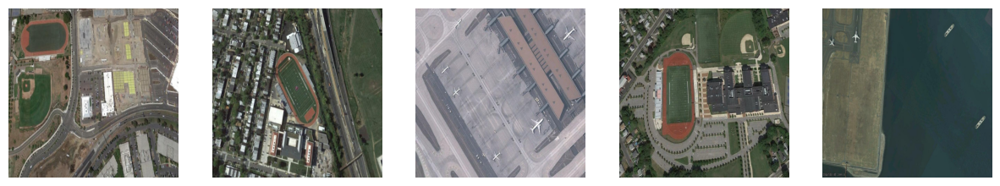

In [21]:
show_images(train_images_augmented)

[747, 706]


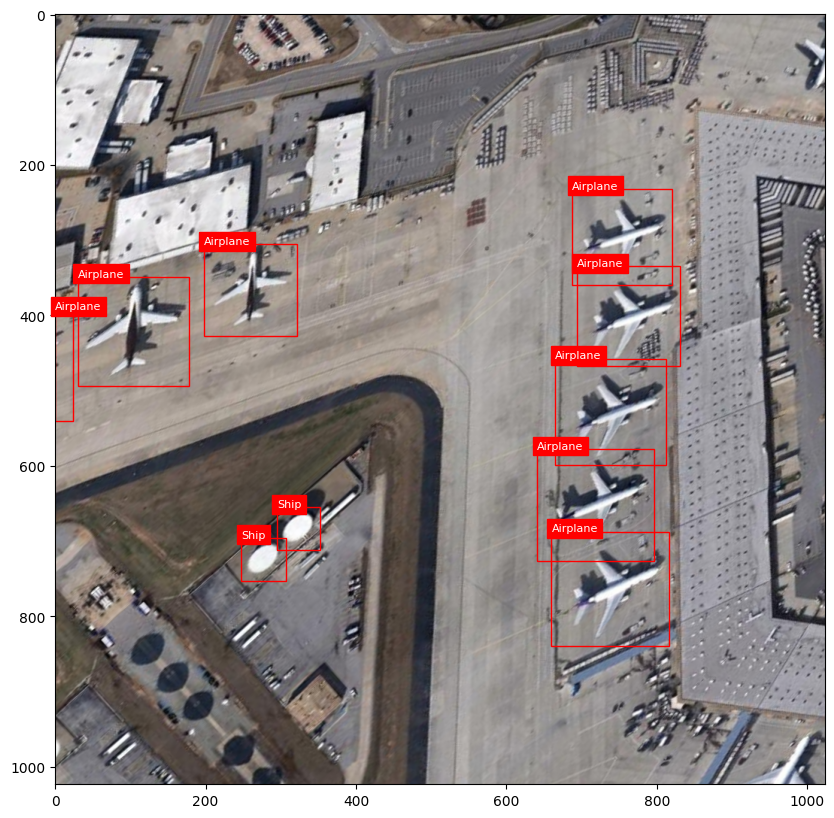

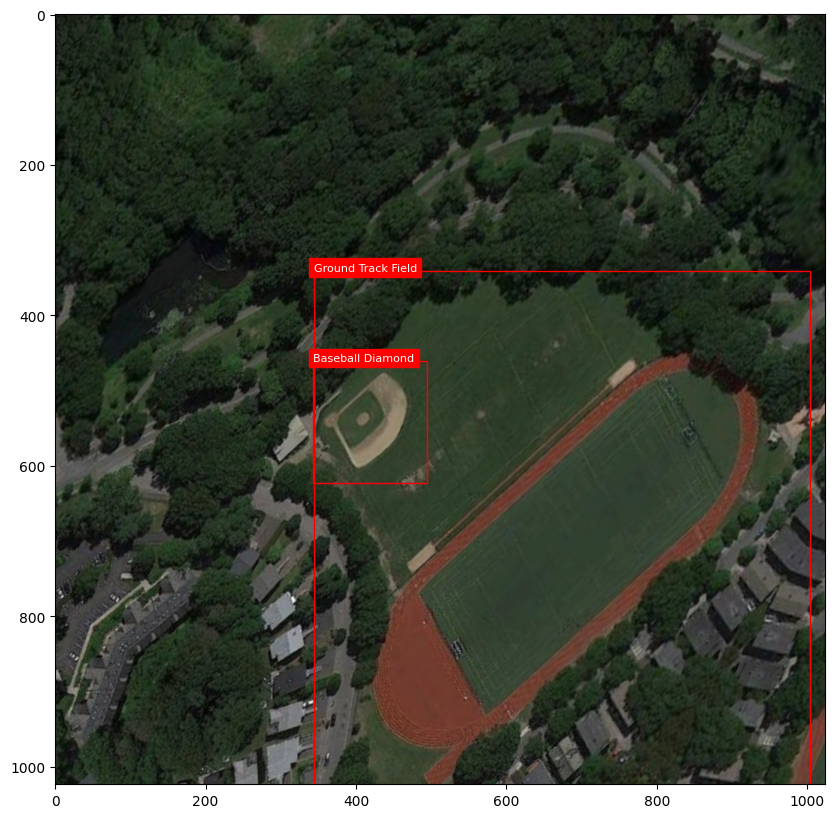

In [22]:
# Select random images to display
num_samples_to_show = 2
selected_indices = random.sample(range(len(train_images_augmented)), num_samples_to_show)
print(selected_indices)
for index in selected_indices:
    show_image_with_boxes(train_images_augmented[index], train_annotations_augmented[index])

In [23]:
print("augmented images count:", len(train_images_augmented))
print("train images count:", len(train_images))

augmented images count: 910
train images count: 455


In [24]:
import matplotlib.pyplot as plt

def show_original_and_augmented(images, augmented_images, num_pairs=10):
    plt.figure(figsize=(15, 10))  # Augmenter la taille si nécessaire pour mieux voir les images

    max_pairs = min(num_pairs, len(images))
    for i in range(max_pairs):
        # Afficher l'image originale
        plt.subplot(2, max_pairs, i + 1)
        plt.imshow(images[i])
        plt.title("Original")
        plt.axis('off')

        # Afficher l'image augmentée correspondante
        plt.subplot(2, max_pairs, i + 1 + max_pairs)
        plt.imshow(augmented_images[i])
        plt.title("Augmented")
        plt.axis('off')

    plt.show()

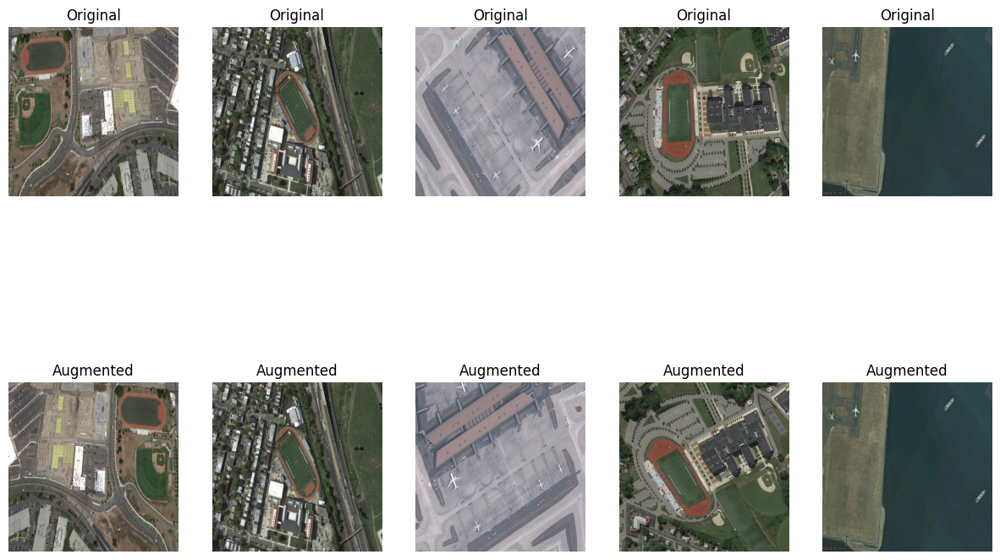

In [25]:
# Sélectionner uniquement les images augmentées (sans les originales incluses deux fois)
augmented_only_images = train_images_augmented[len(train_images):]

# Appeler la fonction pour afficher les images
show_original_and_augmented(train_images, augmented_only_images, num_pairs=5)

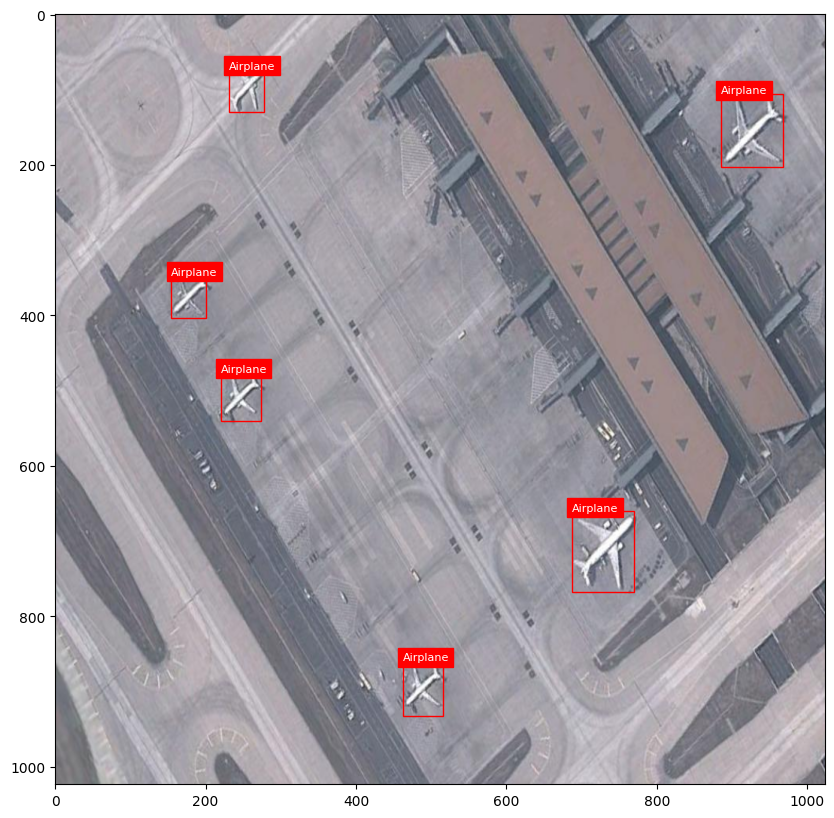

In [26]:
show_image_with_boxes(train_images_augmented[2], train_annotations_augmented[2])

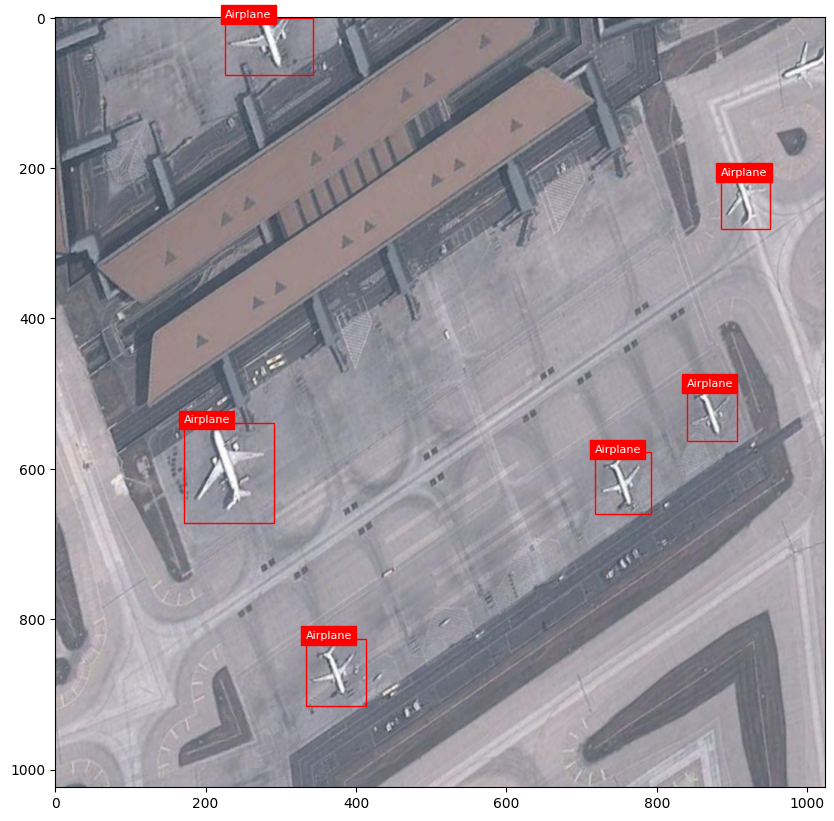

In [27]:
show_image_with_boxes(train_images_augmented[457], train_annotations_augmented[457])

In [28]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log
import mrcnn.config

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = "C:\\Users\\Yasmine\\OneDrive - ESPRIT\\Bureau\\pdl\\logs"
print("MODEL_DIR: ", MODEL_DIR)

# Local path to trained weights file
# COCO_MODEL_PATH = os.path.join(ROOT_DIR, "remote_sensing_cfg20240505T1512/mask_rcnn_remote_sensing_cfg_0001.h5")
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mrcnn_trained_20e_sgd_sans_aug.h5")
print("COCO_MODEL_PATH", COCO_MODEL_PATH)
# Download COCO trained weights from Releases if needed
# if not os.path.exists(COCO_MODEL_PATH):
#     utils.download_trained_weights(COCO_MODEL_PATH)

MODEL_DIR:  C:\Users\Yasmine\OneDrive - ESPRIT\Bureau\pdl\logs
COCO_MODEL_PATH C:\Users\Yasmine\OneDrive - ESPRIT\Bureau\pdl\mrcnn_trained_20e_sgd_sans_aug.h5


Using TensorFlow backend.


In [29]:
import numpy as np

In [30]:
print(tf.__version__)

2.2.0


In [31]:
class_names = {
    1: "Airplane", 2: "Ship", 3: "Storage Tank", 4: "Baseball Diamond",
    5: "Tennis Court", 6: "Basketball Court", 7: "Ground Track Field",
    8: "Harbor", 9: "Bridge", 10: "Vehicle"
}

In [32]:
import numpy as np
from mrcnn import utils

class CustomDataset(utils.Dataset):
    def load_dataset(self, images, annotations, class_names, is_train=True):
        # Add all classes using the provided class names dictionary
        for class_id, class_name in class_names.items():
            self.add_class("dataset", class_id, class_name)
        
        # Load images and annotations
        for idx, (img, anns) in enumerate(zip(images, annotations)):
            self.add_image("dataset", image_id=idx, path=None, image=img, annotations=anns)

    def load_image(self, image_id):
        return self.image_info[image_id]["image"]

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        class_ids = []
        masks = np.zeros((info['image'].shape[0], info['image'].shape[1], len(info['annotations'])), dtype=np.bool_)
        for i, (x1, y1, x2, y2, class_id) in enumerate(info['annotations']):
            masks[int(y1):int(y2), int(x1):int(x2), i] = True
            class_ids.append(class_id)
        return masks, np.array(class_ids)

    def image_reference(self, image_id):
        """ Return the path of the image. """
        return self.image_info[image_id]


In [33]:
train_augmented_images, val_images, train_augmented_annotations, val_annotations = train_test_split(
    train_images, train_annotations, test_size=0.30, random_state=42)

In [34]:
# Initialize datasets
dataset_train = CustomDataset()
dataset_train.load_dataset(train_augmented_images, train_augmented_annotations, class_names, is_train=True)
dataset_train.prepare()

dataset_val = CustomDataset()
dataset_val.load_dataset(val_images, val_annotations, class_names, is_train=False)
dataset_val.prepare()

dataset_test = CustomDataset()
dataset_test.load_dataset(test_images, test_annotations, class_names, is_train=False)
dataset_test.prepare()


In [56]:
from mrcnn.config import Config
class TrainingConfig(Config):
    NAME = "object_detection"
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 11  # Background + number of object classes
    STEPS_PER_EPOCH = 20  # Adjust based on the size of your dataset
    BACKBONE = "resnet50"
    IMAGE_META_SIZE= 23

config = TrainingConfig()

In [57]:
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                23
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE          

In [58]:
# Create the Mask R-CNN model in training mode
model = modellib.MaskRCNN(mode="training", config=config, model_dir=MODEL_DIR)

In [59]:
model.load_weights(COCO_MODEL_PATH, by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])

In [60]:
# Train the model
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE,
            epochs=1, layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: C:\Users\Yasmine\OneDrive - ESPRIT\Bureau\pdl\logs\object_detection20240602T1741\mask_rcnn_object_detection_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_m

C:\Users\Yasmine\anaconda3\envs\maskrcnn\lib\site-packages\tensorflow\python\framework\indexed_slices.py:434: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/1
 2/20 [==>...........................] - ETA: 4:01 - loss: 3.4941

KeyboardInterrupt: 

In [ ]:
# model_path = MODEL_DIR  # Define the path where you want to save the weights.
# model.keras_model.save_weights(model_path)

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    3.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -120.70000  max:  151.10000  float64
image_metas              shape: (1, 23)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


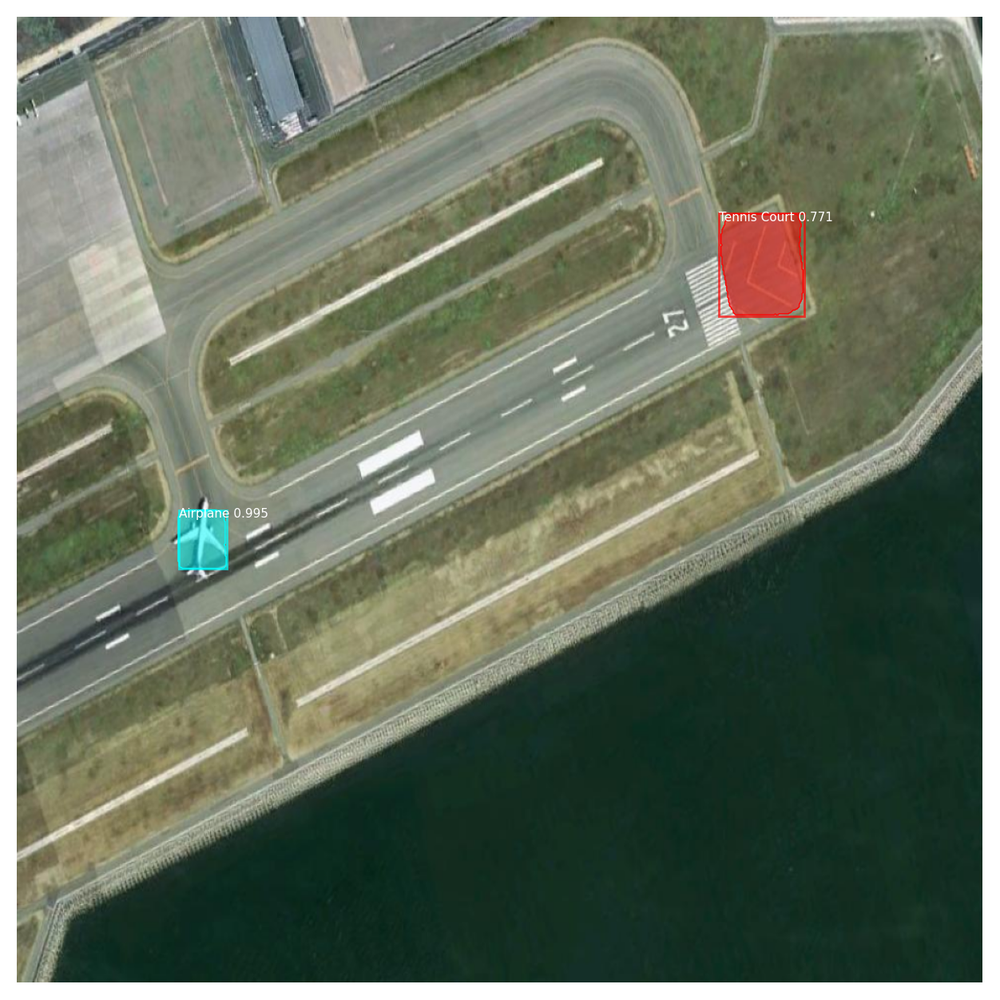

In [61]:
import matplotlib.pyplot as plt
from mrcnn import model as modellib
from mrcnn import visualize
import numpy as np
#from mrcnn.config import Config
from mrcnn import model as modellib
import mrcnn

CLASS_NAMES = ['BG', 'Airplane', 'Ship', 'Storage Tank', 'Baseball Diamond','Tennis Court', 'Basketball Court', 'Ground Track Field', 'Harbor', 'Bridge', 'Vehicle']


class SimpleConfig(mrcnn.config.Config):

    NAME = "satelite_inference"

#set the number of GPUs to use along with the number of images per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes = number of classes + 1 (+1 for the background). The background class is named BG
    NUM_CLASSES = 11

# Initialize the model in inference mode
model_inference = modellib.MaskRCNN(mode="inference", config=SimpleConfig(), model_dir="/path/to/save/logs")

# Load the trained weights
model_inference.load_weights(COCO_MODEL_PATH, by_name=True)

# Select an image from test_images for testing
test_image = test_images[4]

# Perform detection
results = model_inference.detect([test_image], verbose=1)
r = results[0]

# Visualize the detection results
visualize.display_instances(test_image, r['rois'], r['masks'], r['class_ids'],
                            CLASS_NAMES, r['scores'])

plt.show()
